In [1]:
import shap
import pickle
import pandas as pd
from sklearn.preprocessing import StandardScaler
import lime
from pyDOE2 import lhs
import lime.lime_tabular
from classification_utils import *

/Users/lucamoroni/Desktop/__WorkSpace/__Universita/unipi/DataMining/Data_Mining_22_23/venv/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
data = pd.read_csv("dataset/cleaned_user_profiles.csv", index_col=0)

In [3]:
data.head()

,name,lang,bot,created_at,statuses_count,avg_length,avg_special_chars,urls_ratio,mentions_ratio,hashtags_ratio,reply_count_mean,reply_count_std,favorite_count_mean,favorite_count_std,favorite_count_entropy,retweet_count_mean,retweet_count_std
2353593986,Lamonica Raborn,en,1,2019-02-22 18:00:42,76,62.340909,14.015152,0.000000,0.272727,0.098485,0.0,0.0,0.037879,0.190903,0.232481,0.037879,0.190903
2358850842,Lourie Botton,en,0,2019-02-26 03:02:32,54,69.082645,15.041322,0.000000,0.338843,0.024793,0.0,0.0,0.049587,0.217090,0.284639,0.024793,0.155495
137959629,Dadan Syarifudin,en,1,2015-04-30 07:09:56,53,65.340909,14.694444,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
466124818,Carletto Focia,it,1,2017-01-18 02:49:18,50,86.944871,18.689463,0.022331,0.006281,0.072575,0.0,0.0,0.165387,0.530838,0.669155,0.826239,13.034008
2571493866,MBK Ebook,en,0,2019-06-18 19:30:21,7085,72.311246,14.582073,0.000825,0.506461,0.118229,0.0,0.0,0.056365,0.243387,0.317182,0.016772,0.142619


In [4]:
train_set, test_set, train_label, test_label = prepare_data(data)

Classification features : ['created_at', 'statuses_count', 'avg_length', 'avg_special_chars', 'urls_ratio', 'mentions_ratio', 'hashtags_ratio', 'reply_count_mean', 'reply_count_std', 'favorite_count_mean', 'favorite_count_std', 'favorite_count_entropy', 'retweet_count_mean', 'retweet_count_std']


In [5]:
features = test_set.columns.to_list()

In [6]:
with open("models_checkpoints/random_forest_no_lang.bin", "rb") as f:
    dt_model = pickle.load(f)

## Explain Model: SHAP

In [7]:
shap_values_tree = shap.TreeExplainer(dt_model).shap_values(test_set.iloc[0:200])

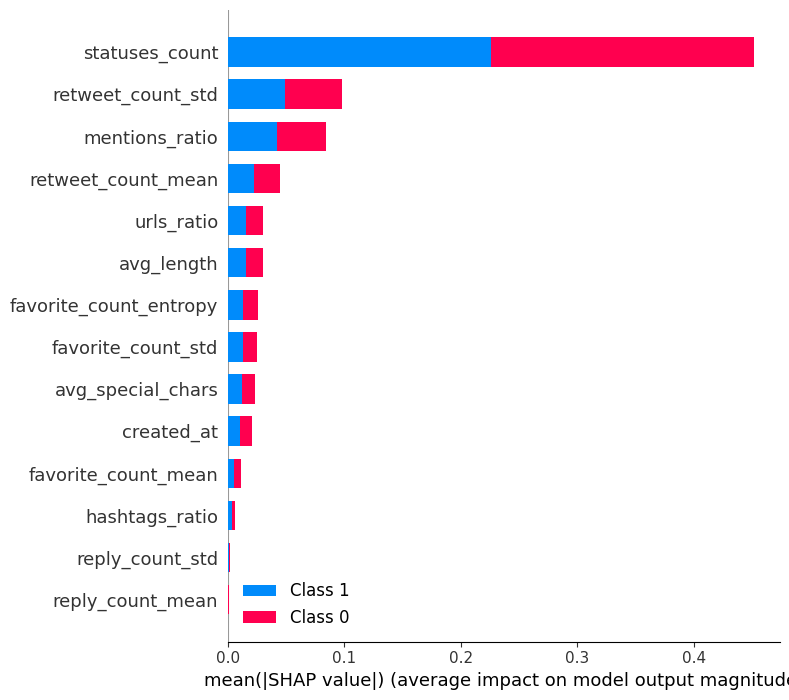

In [8]:
shap.summary_plot(shap_values_tree, test_set.iloc[0:200])

In [9]:
shap_values_tree[0].shape

(200, 14)

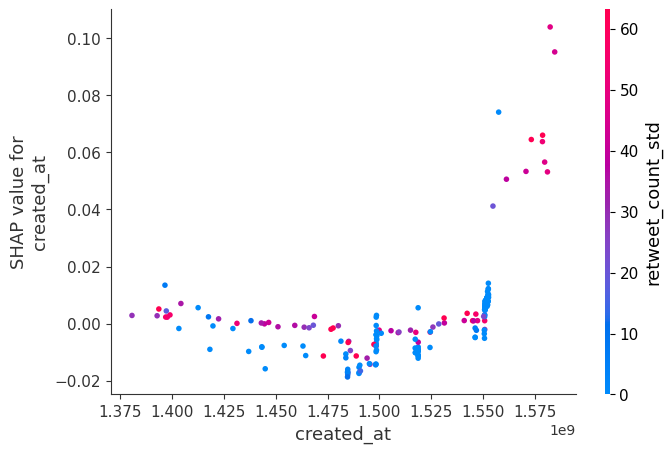

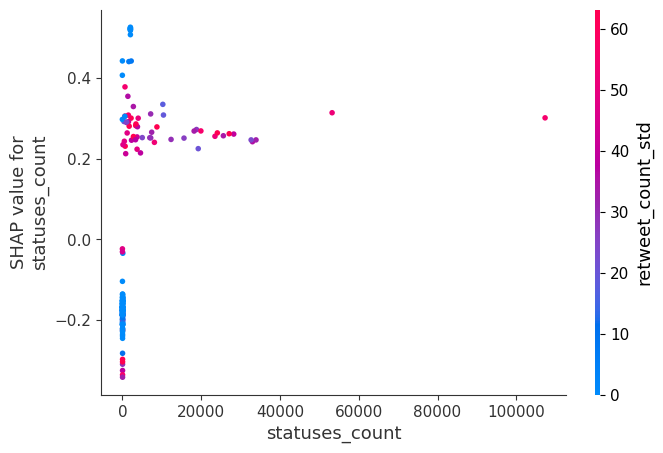

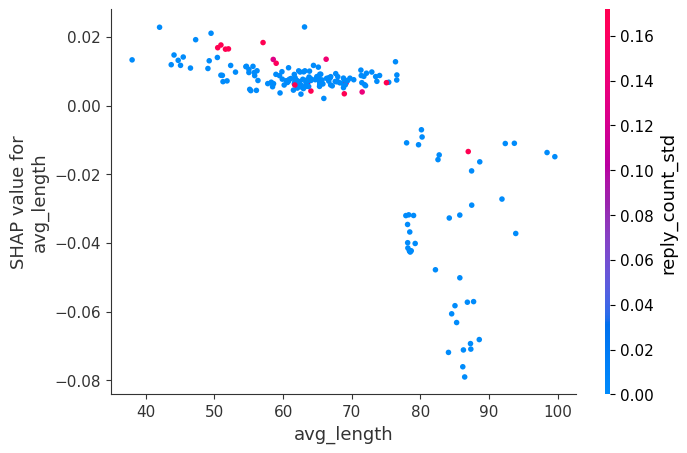

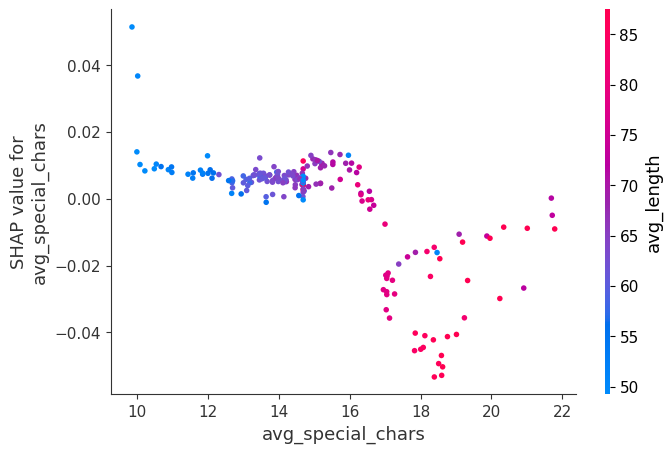

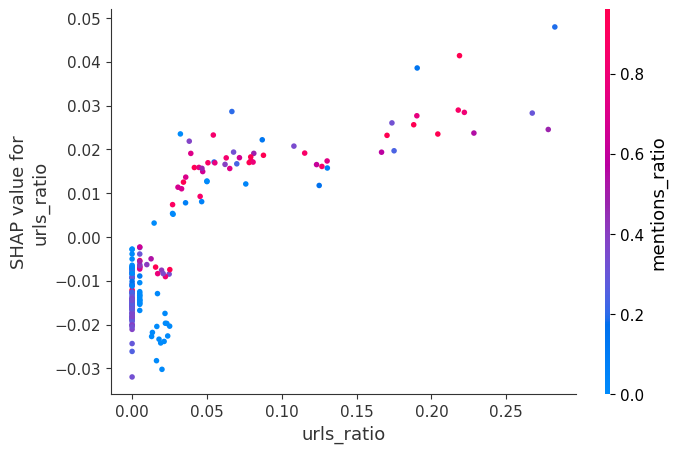

...

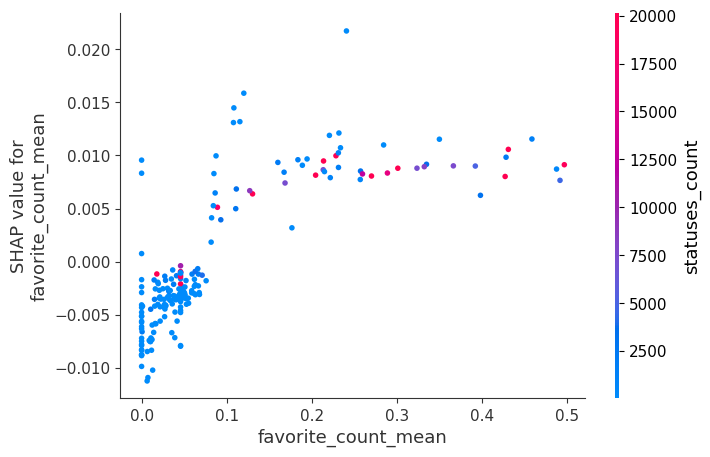

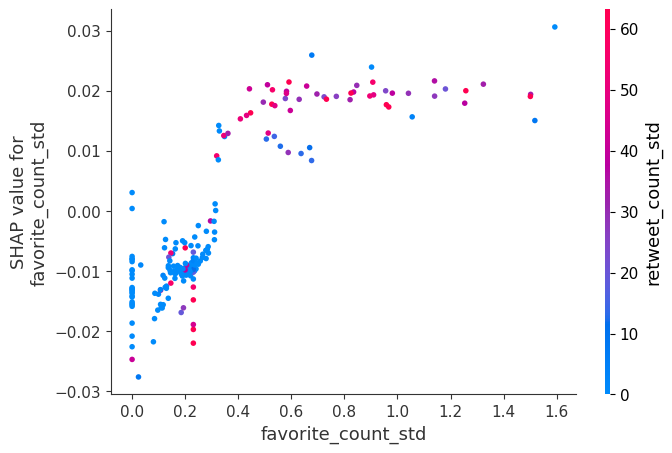

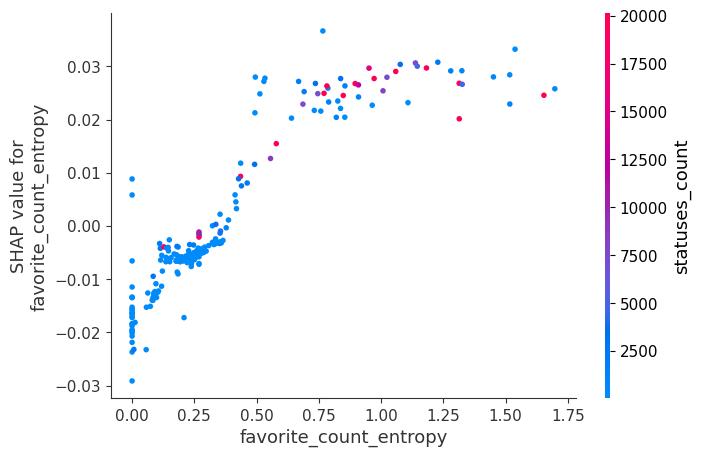

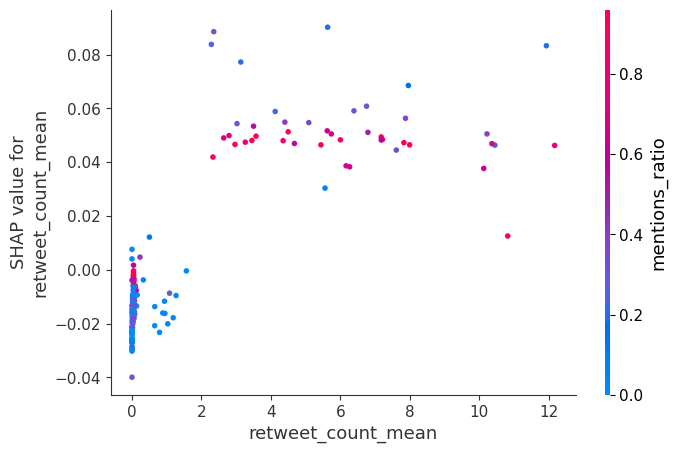

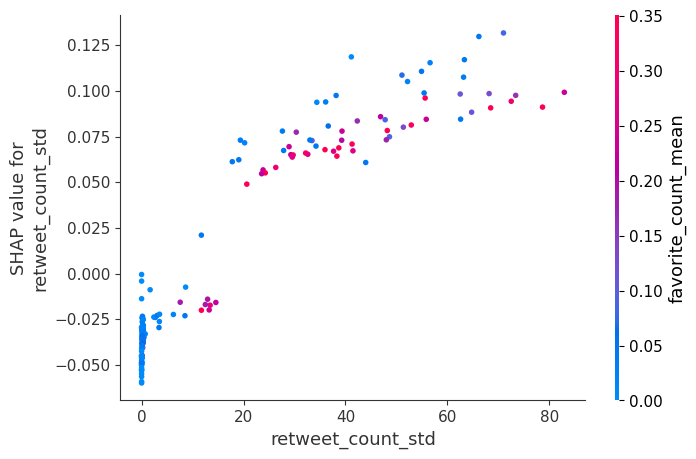

In [10]:
for feat in features:
    shap.dependence_plot(feat, shap_values_tree[0], test_set.iloc[0:200])

In [11]:
shap.initjs()

In [12]:
shap.force_plot(shap.TreeExplainer(dt_model).expected_value[0], shap_values_tree[0], test_set.iloc[0:200])

In [13]:
shap.force_plot(shap.TreeExplainer(dt_model).expected_value[1], shap_values_tree[1], test_set.iloc[0:200])

In [14]:
shap_interaction_values_tree = shap.TreeExplainer(dt_model).shap_interaction_values(test_set.iloc[0:200])

In [15]:
len(shap_interaction_values_tree)

2

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


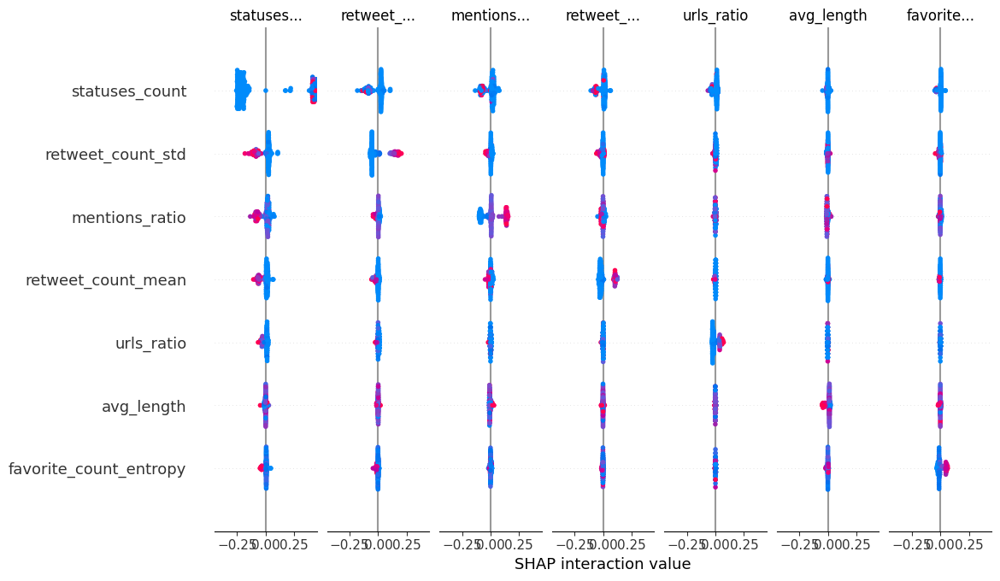

In [16]:
shap.summary_plot(shap_interaction_values_tree[0], test_set.iloc[0:200])

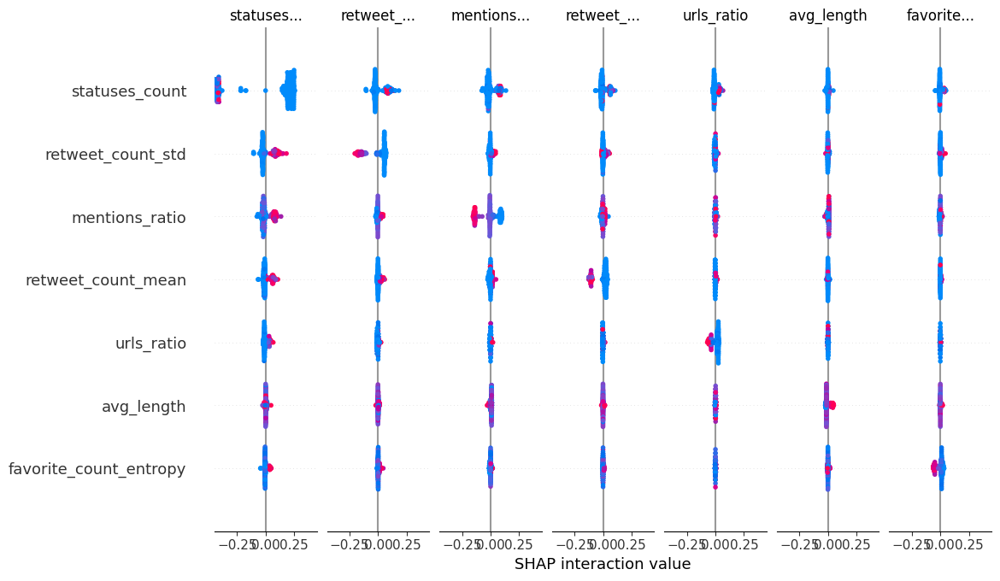

In [17]:
shap.summary_plot(shap_interaction_values_tree[1], test_set.iloc[0:200])

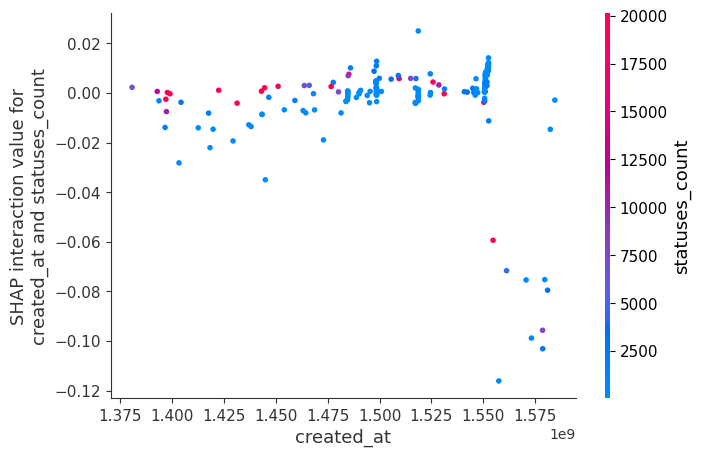

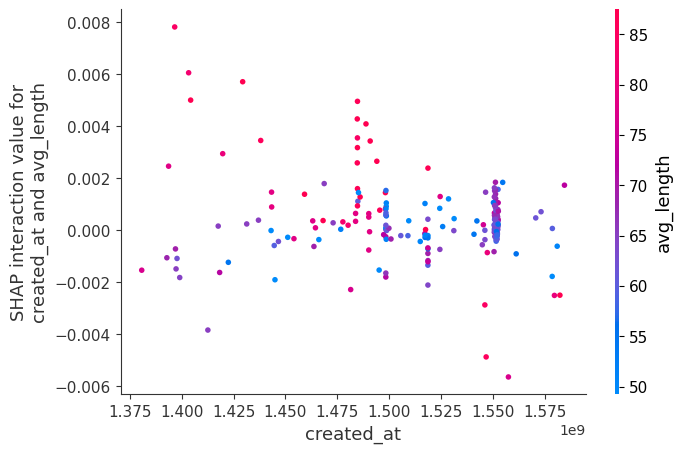

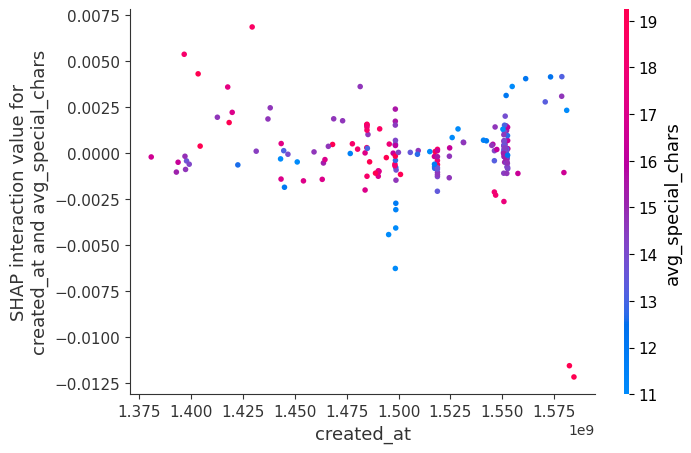

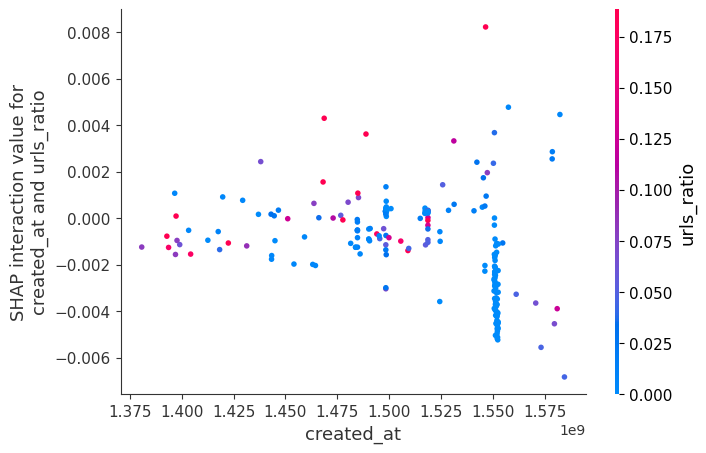

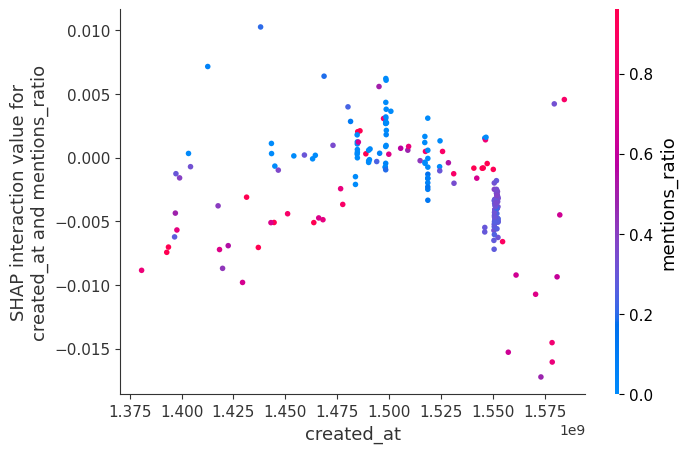

...

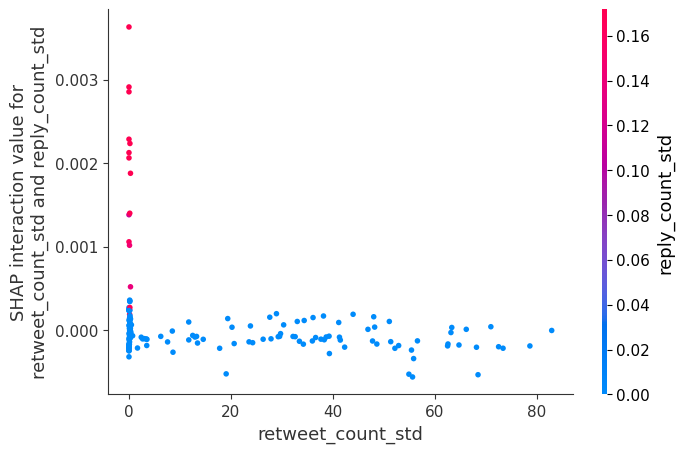

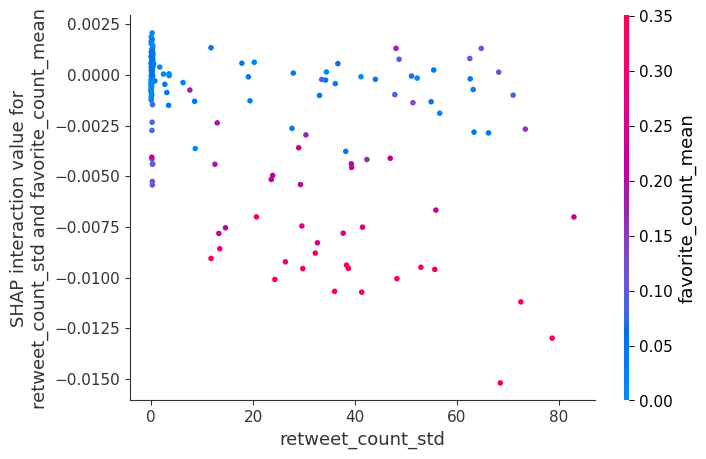

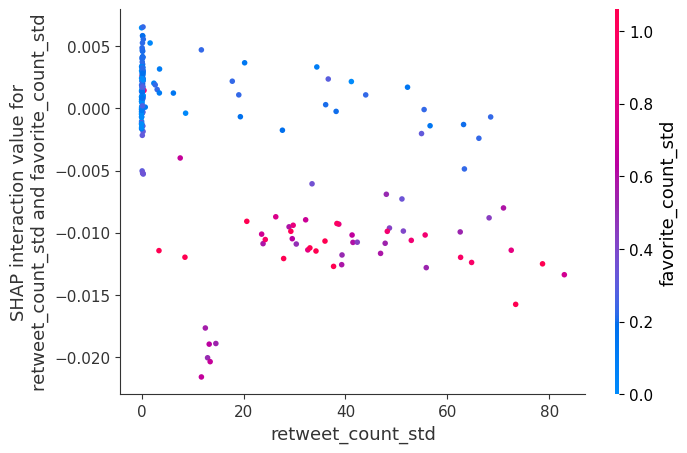

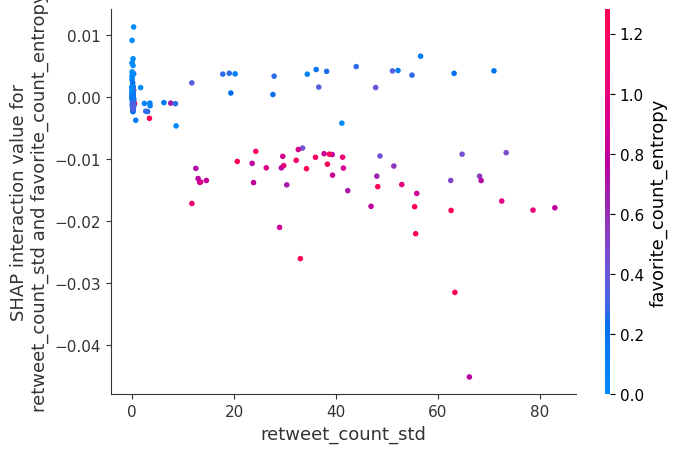

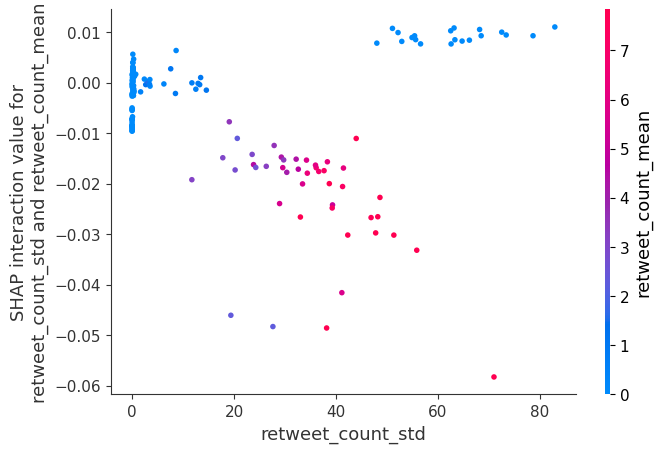

In [18]:
for feat1 in features:
    for feat2 in features:
        if feat1 != feat2:
            shap.dependence_plot(
                (feat1, feat2),
                shap_interaction_values_tree[0], test_set.iloc[0:200]
            )

### Local Explanation

In [19]:
test_set.iloc[1]

created_at                1.581027e+09
statuses_count            3.737000e+03
avg_length                5.114919e+01
avg_special_chars         1.089514e+01
urls_ratio                1.232432e-01
mentions_ratio            6.140541e-01
hashtags_ratio            1.275676e-01
reply_count_mean          0.000000e+00
reply_count_std           0.000000e+00
favorite_count_mean       9.297297e-02
favorite_count_std        4.312199e-01
favorite_count_entropy    4.276750e-01
retweet_count_mean        1.012865e+01
retweet_count_std         4.863283e+01
Name: 3018833249, dtype: float64

In [20]:
test_label.iloc[1]

0

In [21]:
dt_model.predict(test_set.values[1].reshape(1, -1))

array([0])

In [22]:
shap.force_plot(shap.TreeExplainer(dt_model).expected_value[0], shap_values_tree[0][1,:], features)

In [23]:
test_set.iloc[2]

created_at                1.550770e+09
statuses_count            7.600000e+01
avg_length                6.758621e+01
avg_special_chars         1.476552e+01
urls_ratio                0.000000e+00
mentions_ratio            2.896552e-01
hashtags_ratio            4.827586e-02
reply_count_mean          0.000000e+00
reply_count_std           0.000000e+00
favorite_count_mean       5.517241e-02
favorite_count_std        2.567519e-01
favorite_count_entropy    3.075908e-01
retweet_count_mean        4.137931e-02
retweet_count_std         1.991659e-01
Name: 2352015044, dtype: float64

In [24]:
test_label.iloc[2]

1

In [25]:
dt_model.predict(test_set.values[2].reshape(1, -1))

array([1])

In [26]:
shap.force_plot(shap.TreeExplainer(dt_model).expected_value[1], shap_values_tree[1][2,:], features)

## Explain Model: LIME

In [27]:
lime_explainer = lime.lime_tabular.LimeTabularExplainer(train_set.values, feature_names = features)

In [28]:
exp = lime_explainer.explain_instance(test_set.values[0], dt_model.predict_proba, top_labels=0)
exp.show_in_notebook(show_table=True, show_all=True)

In [29]:
exp = lime_explainer.explain_instance(test_set.values[2], dt_model.predict_proba, top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)

## Explain: Evaluation

### Lime

In [30]:
from aix360.metrics import faithfulness_metric, monotonicity_metric

predicted_class = dt_model.predict(test_set.values[0].reshape(1,-1))[0]

le = exp.local_exp[predicted_class]

m = exp.as_map()

x = test_set.values[0]
coefs = np.zeros(x.shape[0])

for v in le:
    coefs[v[0]] = v[1]


base = np.zeros(x.shape[0])


print("Faithfulness: ", faithfulness_metric(dt_model, x, coefs, base))
print("Monotonity: ", monotonicity_metric(dt_model, x, coefs, base))

Faithfulness:  -0.9867082789931797
Monotonity:  False


In [31]:
ncases = 100
fait = np.zeros(ncases)
for i in range(ncases):
    predicted_class = dt_model.predict(test_set.values[i].reshape(1,-1))[0]
    exp = lime_explainer.explain_instance(test_set.values[i], dt_model.predict_proba, top_labels=1)
    le = exp.local_exp[predicted_class]
    m = exp.as_map()
    
    x = test_set.values[i]
    coefs = np.zeros(x.shape[0])
    
    for v in le:
        coefs[v[0]] = v[1]
    fait[i] = faithfulness_metric(dt_model, test_set.values[i], coefs, base)
    
fait[np.isnan(fait)] = 0

In [32]:
print("Faithfulness metric mean: ",np.mean(fait))
print("Faithfulness metric std. dev.:", np.std(fait))

Faithfulness metric mean:  0.5717964371613516
Faithfulness metric std. dev.: 0.7087333204993342


### Shap

In [33]:
print("Faithfulness: ", faithfulness_metric(dt_model, x, shap_values_tree[predicted_class][0], base))
print("Monotonity: ", monotonicity_metric(dt_model, x, shap_values_tree[predicted_class][0], base))

Faithfulness:  0.8548100115276367
Monotonity:  False


In [34]:
ncases = 100
fait = np.zeros(ncases)
for i in range(ncases):
    predicted_class = dt_model.predict(test_set.values[i].reshape(1,-1))[0]
    fait[i] = faithfulness_metric(dt_model, test_set.values[i], shap_values_tree[predicted_class][i], base)

fait[np.isnan(fait)] = 0

In [35]:
print("Faithfulness metric mean: ",np.mean(fait))
print("Faithfulness metric std. dev.:", np.std(fait))

Faithfulness metric mean:  0.8895554156077138
Faithfulness metric std. dev.: 0.162535733906857
